In [11]:
import numpy as np 
import pandas as pd 
import pandas_profiling as pp
import altair as alt
from altair import Chart, X, Y, Axis, SortField
from vega_datasets import data
from altair import expr, datum
from altair.expr import datum
# for the notebook only (not for JupyterLab) run this command once per session
alt.renderers.enable('notebook')
alt.data_transformers.enable('default', max_rows=None) 

DataTransformerRegistry.enable('default')

In [12]:
alt.data_transformers.enable('default', max_rows=None) 

DataTransformerRegistry.enable('default')

In [13]:
df_winter = pd.read_csv('winter.csv')
df_summer = pd.read_csv('summer.csv')
df_sumandwint = pd.read_csv('sumandwint.csv')
df_dictionary = pd.read_csv('dictionary.csv')

In [14]:
df_summer.head()

,Year,City,Sport,Discipline,Athlete,Country,Gender,Event,Medal
0,1896,Athens,Aquatics,Swimming,"HAJOS, Alfred",HUN,Men,100M Freestyle,Gold
1,1896,Athens,Aquatics,Swimming,"HERSCHMANN, Otto",AUT,Men,100M Freestyle,Silver
2,1896,Athens,Aquatics,Swimming,"DRIVAS, Dimitrios",GRE,Men,100M Freestyle For Sailors,Bronze
3,1896,Athens,Aquatics,Swimming,"MALOKINIS, Ioannis",GRE,Men,100M Freestyle For Sailors,Gold
4,1896,Athens,Aquatics,Swimming,"CHASAPIS, Spiridon",GRE,Men,100M Freestyle For Sailors,Silver


In [15]:
df_dictionary.head()

,Country,Code,Population,GDP per Capita,CountryName,City,CapitalLatitude,CapitalLongitude,CountryCode,ContinentName
0,Afghanistan,AFG,32526562.0,594.323081,Afghanistan,Kabul,34.516667,69.183333,AF,Asia
1,Albania,ALB,2889167.0,3945.217582,Albania,Tirana,41.316667,19.816667,AL,Europe
2,Algeria,ALG,39666519.0,4206.031232,Algeria,Algiers,36.750000,3.050000,DZ,Africa
3,American Samoa*,ASA,55538.0,NaN,American Samoa,Pago Pago,-14.266667,-170.700000,AS,Australia
4,Andorra,AND,70473.0,NaN,Andorra,Andorra la Vella,42.500000,1.516667,AD,Europe


In [6]:
summer_with_country_winner  = pd.merge(df_summer, 
                  df_dictionary[['CountryName','Code','ContinentName']],
                  left_on='Country',
                  right_on='Code',
                  how='left')
summer_with_country_winner.drop(['Country'], axis=1)
summer_with_code  = pd.merge(summer_with_country_winner, 
                  df_dictionary[['City','Country', 'CapitalLatitude','CapitalLongitude','ContinentName']],
                  on='City',
                  how='left')

In [7]:
top_countries = summer_with_code['Country_x'].value_counts()[:25].index.tolist()

In [8]:
filtered_summer = summer_with_code[summer_with_code['Country_x'].isin(top_countries)].reset_index()

In [9]:
filtered_summer.head()

,index,Year,City,Sport,Discipline,Athlete,Country_x,Gender,Event,Medal,CountryName,Code,ContinentName_x,Country_y,CapitalLatitude,CapitalLongitude,ContinentName_y
0,0,1896,Athens,Aquatics,Swimming,"HAJOS, Alfred",HUN,Men,100M Freestyle,Gold,Hungary,HUN,Europe,Greece,37.983333,23.733333,Europe
1,6,1896,Athens,Aquatics,Swimming,"HAJOS, Alfred",HUN,Men,1200M Freestyle,Gold,Hungary,HUN,Europe,Greece,37.983333,23.733333,Europe
2,11,1896,Athens,Athletics,Athletics,"LANE, Francis",USA,Men,100M,Bronze,United States,USA,Central America,Greece,37.983333,23.733333,Europe
3,12,1896,Athens,Athletics,Athletics,"SZOKOLYI, Alajos",HUN,Men,100M,Bronze,Hungary,HUN,Europe,Greece,37.983333,23.733333,Europe
4,13,1896,Athens,Athletics,Athletics,"BURKE, Thomas",USA,Men,100M,Gold,United States,USA,Central America,Greece,37.983333,23.733333,Europe


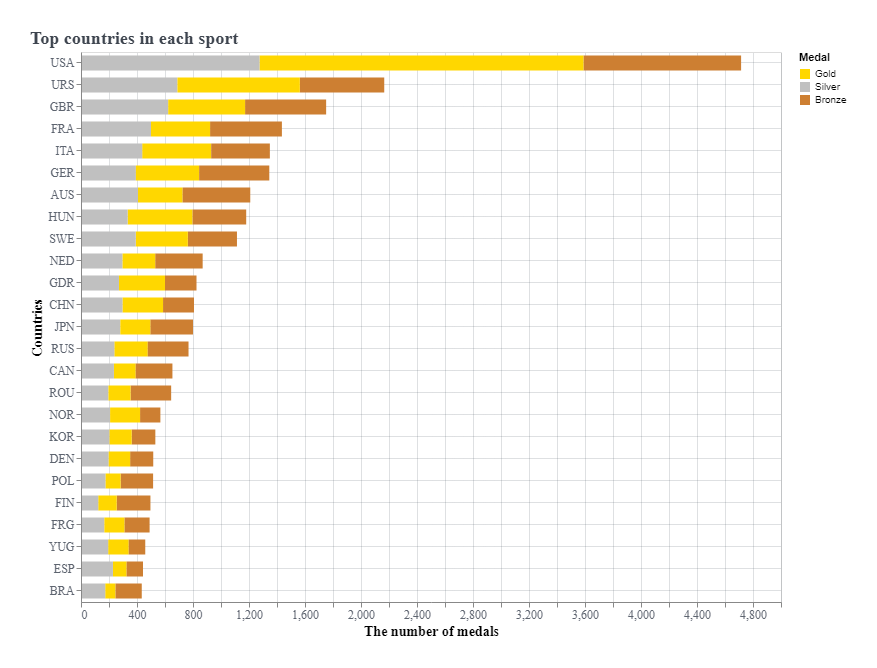

In [10]:
select_box = alt.binding_select(options=list(summer_with_code['Sport'].unique()))
selection_box = alt.selection_single(name='Select', fields=['Sport'], bind=select_box)

bar_chart = alt.Chart(filtered_summer).mark_bar(size=15).encode(
    x=alt.X('count()', axis=alt.Axis(title='The number of medals')),
    y=alt.Y('Country_x:N', sort=alt.EncodingSortField(field='Medal', order='descending', op='count'),
        axis=Axis(title='Countries')),
    color=alt.Color('Medal:N', scale=alt.Scale(range=["#ffd700", "#c0c0c0", "#cd7f32"]), sort=['Gold', 'Silver','Bronze']),
    order=alt.Order('Medal', sort='descending'),
).add_selection(
    selection_box,
).transform_filter(
    selection_box 
).configure_axis(
    labelFont='Lato Regular', labelColor='#5d646f', labelFontSize=12,
    titleFont='Lato Regular Italic', titleFontSize=14, grid=True, gridColor='#5d646f', gridDash=[0.5, 0.5, 0.5], gridOpacity=0.4               
).properties(
    width=700,
    height=550, padding=30,
    title = alt.TitleParams(text = 'Top countries in each sport', anchor='start',
                            font = 'Lato Bold', fontSize = 18, color = '#3E454F')
)

from IPython.display import HTML
display(HTML("""
<style>
.vega-embed{
    position: relative;
}
.vega-bind {
  position: relative;
  top: -520px;
  left: 780px;
  display: inline;
}
select {
    width: 100px;
}
.vega-bind-name{
    padding-right: 5px;
}
</style>
"""))
display(bar_chart)